<a href="https://colab.research.google.com/github/Mirabelljoicelaura/PCVK/blob/main/Week10/Week10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


KELOMPOK 8

Nama Anggota Kelompok :

1. Mirabell Joice Laura (2141720174)
2. M. Edwin Isa Alfais (2141720193)
3. Nabilah Amaalina Syafa (2141720198)

#Tugas Praktikum

## 1. Import folder yang ada di drive

In [24]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 2. Import beberapa library

In [25]:
!pip install pytesseract

In [26]:
import numpy as np
import pandas as pd
import cv2
import pytesseract
import matplotlib.pyplot as plt
from PIL import Image

## 3. Buat Global Threshold
(BINARY, BINARY_INV, TRUNC, TOZERO, TOZERO_INV), dengan
threshold= 170, secara manual sesuai dengan deskripsi dari grafik yang ditunjukkan di
bawah.


## Tanpa Library

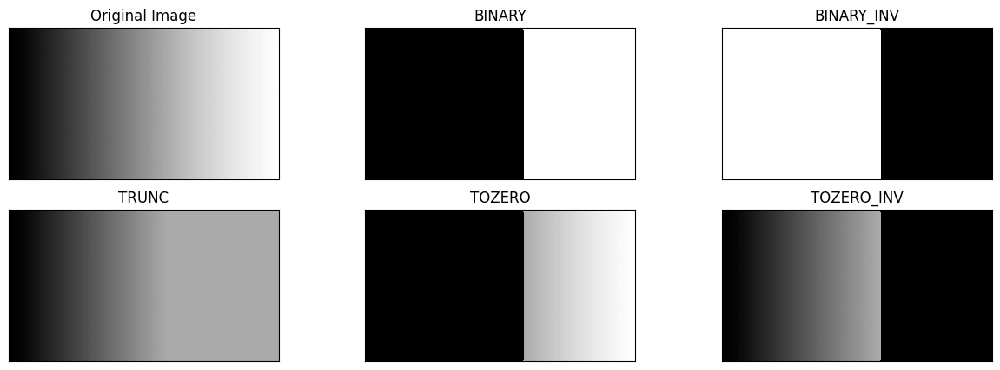

In [59]:
citra = ('/content/drive/MyDrive/PCVK/image/image_week10/gradient.jpg')

img = cv2.imread(citra, 0)
thresh1 = cv2.imread(citra)
thresh2 = cv2.imread(citra)
thresh3 = cv2.imread(citra)
thresh4 = cv2.imread(citra)
thresh5 = cv2.imread(citra)

thresh = 170

#1. Original Image
thresh1[img>thresh] = 255
thresh1[img<=thresh] = 0

#2. Binary threshold inverse
thresh2 = 255 - thresh1
#3. Threshold Truncate
thresh3[img>thresh] = thresh
#4. Threshold Tozero
thresh4[img<=thresh] = 0
#5. Threshold Tozero Inverse
thresh5[img>thresh] = 0

titles = ['Original Image','BINARY','BINARY_INV','TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

plt.figure(figsize = (15,5))
for i in range(len(images)):
  plt.subplot(2,3,i+1),plt.imshow(images[i],'gray', interpolation='nearest')
  plt.title(titles[i])
  plt.xticks([]),plt.yticks([])

plt.show()

## Menggunakan Library

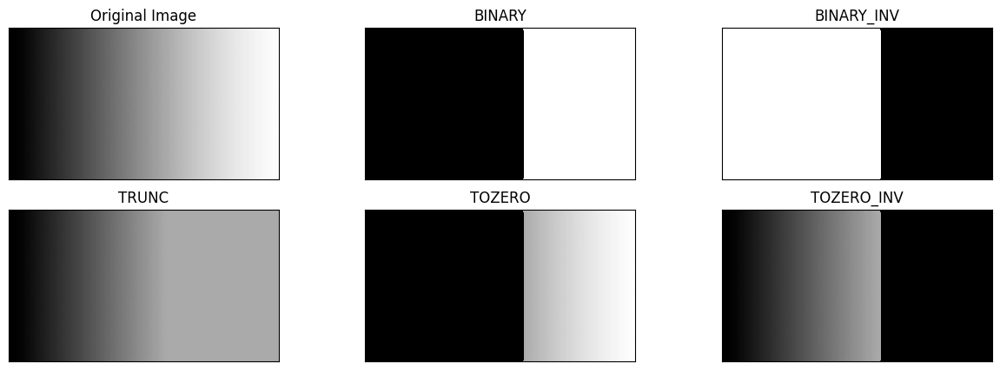

In [28]:
citra = ('/content/drive/MyDrive/PCVK/image/image_week10/gradient.jpg')

img = cv2.imread(citra)

# Deklarasikan nilai citra
thresh = 170
#1. thresh1 jika pixel di img>170, maka thresh1 bernilai 1(putih) sedangkan jika bernilai 0(hitam)
ret,thresh1 = cv2.threshold(img,thresh,255,cv2.THRESH_BINARY)
#2. Binary threshold inverse
ret,thresh2 = cv2.threshold(img,thresh,255,cv2.THRESH_BINARY_INV)
#3. Threshold Truncate
ret,thresh3 = cv2.threshold(img,thresh,255,cv2.THRESH_TRUNC)
#4. Threshold Tozero
ret,thresh4 = cv2.threshold(img,thresh,255,cv2.THRESH_TOZERO)
#5. Threshold Tozero Inverse
ret,thresh5 = cv2.threshold(img,thresh,255,cv2.THRESH_TOZERO_INV)
titles = ['Original Image','BINARY','BINARY_INV','TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
plt.figure(figsize = (15,5))
for i in range(len(images)):
 plt.subplot(2,3,i+1), plt.imshow(images[i], 'gray', interpolation='nearest')
 plt.title(titles[i])
 plt.xticks([]),plt.yticks([])
plt.show()

## 4.Buat Otsu Thresholding
tanpa menggunakan Library. Tampilkan juga nilai threshold
saat anda gunakan Otsu’s, seperti terlihat pada gambar hasil berikut. (gunakan image
ktp Riyanto.jpg agar terlihat beda antara hasil otsu’s dengan global threshold biasa)

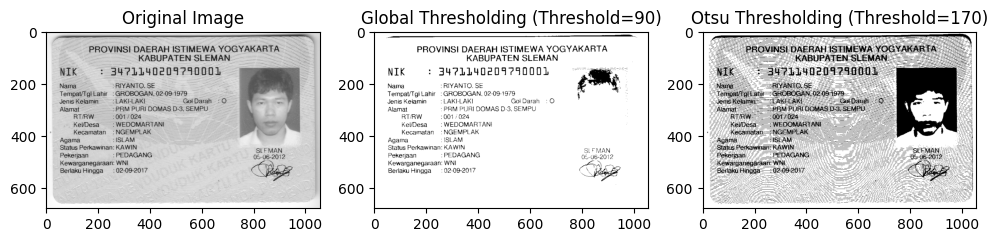

In [30]:
citra = ('/content/drive/MyDrive/KTP_More/ktp.png')

# Membaca citra dalam grayscale
img = cv2.imread(citra, cv2.IMREAD_GRAYSCALE)

# Menghitung histogram citra
histogram = cv2.calcHist([img], [0], None, [256], [0,256])

# Definisi fungsi untuk menghitung threshold Otsu
def otsu_threshold(histogram):
    total_pixels = np.sum(histogram)
    max_var = 0
    threshold = 0

    for t in range(256):
        background_pixels = np.sum(histogram[:t])
        foreground_pixels = np.sum(histogram[t:])

        if background_pixels == 0 or foreground_pixels == 0:
            continue

        background_weight = background_pixels / total_pixels
        foreground_weight = foreground_pixels / total_pixels

        mean_background = np.sum(np.arange(t) * histogram[:t]) / background_pixels
        mean_foreground = np.sum(np.arange(t, 256) * histogram[t:]) / foreground_pixels

        variance_between_classes = background_weight * foreground_weight * (mean_background - mean_foreground) ** 2

        if variance_between_classes > max_var:
            max_var = variance_between_classes
            threshold = t

    return threshold

# Mendeklarasikan nilai threshold global dan Otsu
otsu_thresh = 170
global_thresh = 90

# Mengaplikasikan thresholding dengan metode Otsu
otsu_result = (img > otsu_thresh).astype(np.uint8) * 255

# Mengaplikasikan thresholding dengan metode global
global_result = (img > global_thresh).astype(np.uint8) * 255

# Menampilkan gambar dengan tiga subplot
plt.figure(figsize=(12, 4))
plt.subplot(131), plt.imshow(img, cmap='gray'), plt.title('Original Image')
plt.subplot(132), plt.imshow(global_result, cmap='gray'), plt.title(f'Global Thresholding (Threshold={global_thresh})')
plt.subplot(133), plt.imshow(otsu_result, cmap='gray'), plt.title(f'Otsu Thresholding (Threshold={otsu_thresh})')
plt.show()


## 5. Buat histogram dari citra tersegmentasi,
Histogram hanya pada foreground image
saja. Gunakan image ktp Riyanto.jpg yang sudah disediakan di folder images.
Petunjuk:
a. anda dapat gunakan cv.calcHist untuk menampilkan histogram. <BR>
b. Buka link berikut https://opencvtutorial.readthedocs.io/en/latest/histogram/histogram.html <BR>
c. Dari link tersebut perhatikan bahwa cv.calcHist memiliki salah satu parameter
yaitu mask. Jika diset None, maka keseluruhan image akan dihitung
histogramnya. Jika kita tentukan mask, maka hanya bagian image yang
dimasking warna putih yang akan dihitung histogramnya (dari contoh
dibawah dinamakan dengan Citra Segment).

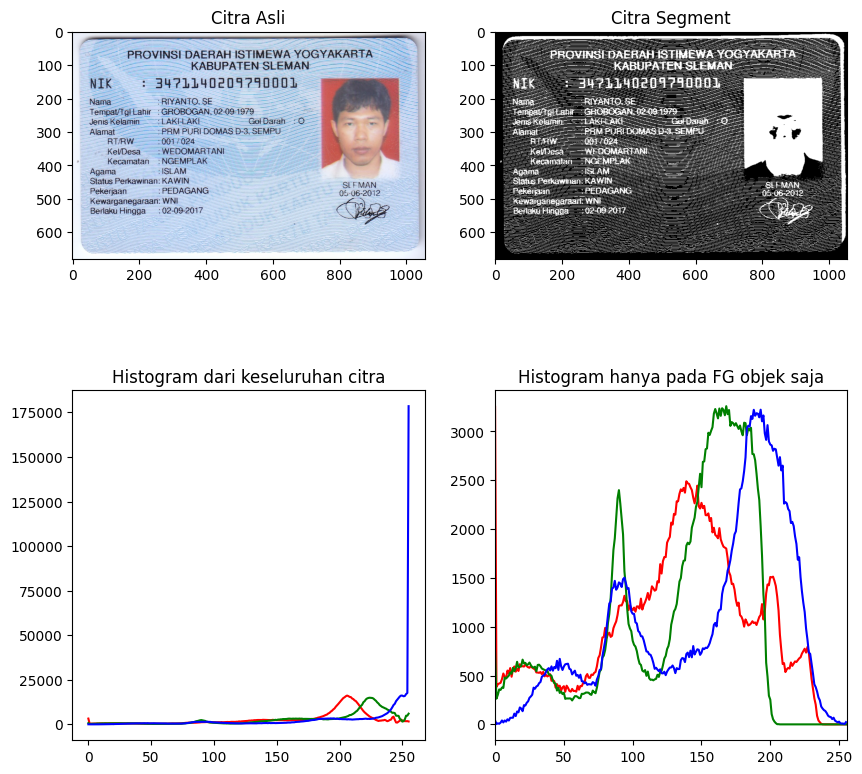

In [42]:
# Baca citra
citra = ('/content/drive/MyDrive/KTP_More/ktp.png')

# Membaca citra dan mengonversinya ke format RGB
img = cv2.imread(citra)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mengonversi citra asli ke citra grayscale
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)

# Menggunakan thresholding untuk membuat citra segmentasi (mask)
ret3, mask = cv2.threshold(img_gray, 200, 255, cv2.THRESH_BINARY_INV)

# Menampilkan citra asli dan citra segmentasi
plt.figure(figsize=(10, 10))
plt.subplot(2, 2, 1), plt.imshow(img_rgb)
plt.title('Citra Asli')
plt.subplot(2, 2, 2), plt.imshow(mask, 'gray')
plt.title('Citra Segment')

# Menampilkan histogram dari citra asli dan hanya pada area foreground
color = ('r', 'g', 'b')

for i, col in enumerate(color):
    # Menghitung histogram dari seluruh citra asli
    hist0 = cv2.calcHist([img_rgb], [i], None, [256], [0, 256])
    plt.subplot(2, 2, 3), plt.plot(hist0, color=col)
    plt.title('Histogram dari keseluruhan citra')

    # Menghitung histogram hanya pada area foreground (objek) yang sudah tersegmentasi
    hist1 = cv2.calcHist([img_rgb], [i], mask, [256], [0, 256])
    plt.subplot(2, 2, 4), plt.plot(hist1, color=col)
    plt.title('Histogram hanya pada FG objek saja')
    plt.xlim([0, 256])

plt.show()


## 6. Lakukan segmentasi warna
pada image " ktp Riyanto.jpg ", munculkan hanya warna
yang biru saja. (Petunjuk: anda dapat gunakan K-Means untuk menampilkan hanya
warna tertentu saja)

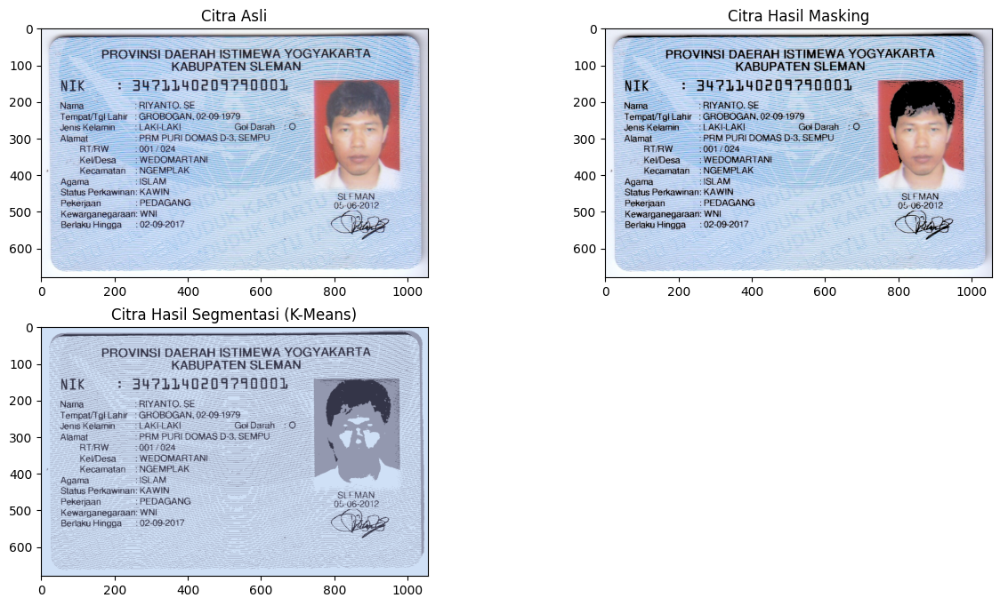

In [57]:
from sklearn.cluster import KMeans

# Baca citra
citra = ('/content/drive/MyDrive/KTP_More/ktp.png')

# Membaca citra dan mengonversinya ke format RGB
img = cv2.imread(citra)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mengambil nilai piksel citra dan mengonversi ke tipe data float32
pixel_values = img_rgb.reshape((-1, 3))
pixel_values = np.float32(pixel_values)

# Menentukan kriteria dan jumlah cluster (k)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
k = 3

# Penerapan K-Means clustering
_, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# Konversi nilai pusat cluster ke tipe data integer
centers = np.uint8(centers)

# Menyusun ulang array label
labels = labels.flatten()

# Buat citra hasil segmentasi dengan mengubah satu cluster menjadi hitam
masked_image = np.copy(img_rgb)
masked_image = masked_image.reshape((-1, 3))
cluster_to_blue = 2
masked_image[labels == cluster_to_blue] = [0, 0, 0]
masked_image = masked_image.reshape(img.shape)

# Konversi citra hasil segmentasi kembali ke bentuk asli
segmented_image = centers[labels].reshape(img.shape)

# Tampilkan citra asli, citra hasil segmentasi, dan citra hasil masking
plt.figure(figsize=(15, 8))
plt.subplot(2, 2, 1), plt.imshow(img_rgb)
plt.title('Citra Asli')

plt.subplot(2, 2, 2), plt.imshow(masked_image)
plt.title('Citra Hasil Masking')

plt.subplot(2, 2, 3), plt.imshow(segmented_image)
plt.title('Citra Hasil Segmentasi (K-Means)')

plt.show()


# Tugas Kelompok

Tugasnya adalah mengimplementasikan thresholding dengan beberapa metode yang
telah Anda ketahui untuk melakukan segmentasi pada dataset KTP pertemuan 7.

In [61]:
import numpy as np
import pandas as pd
import cv2
import pytesseract
from PIL import Image
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import os

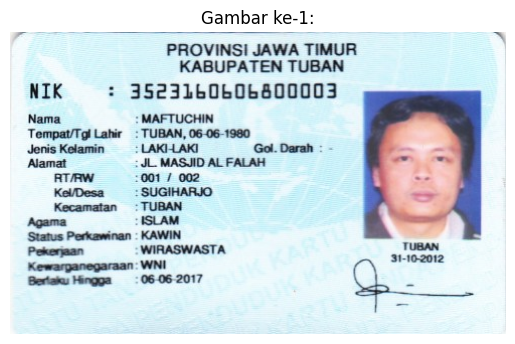

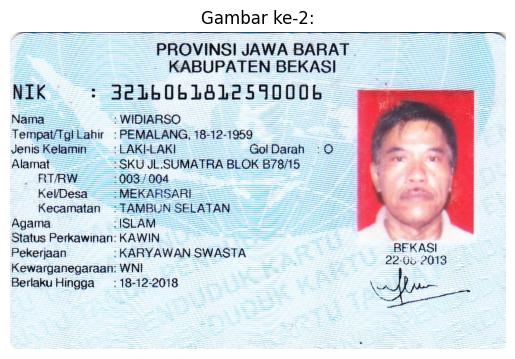

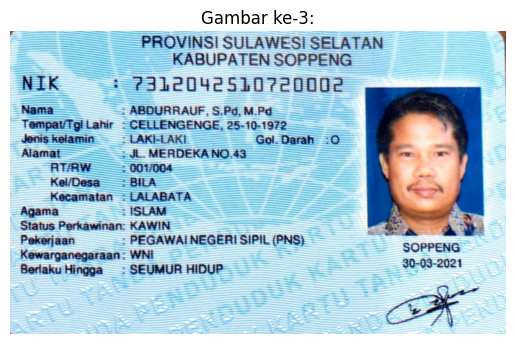

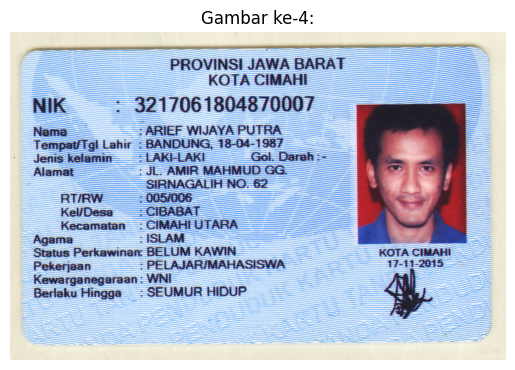

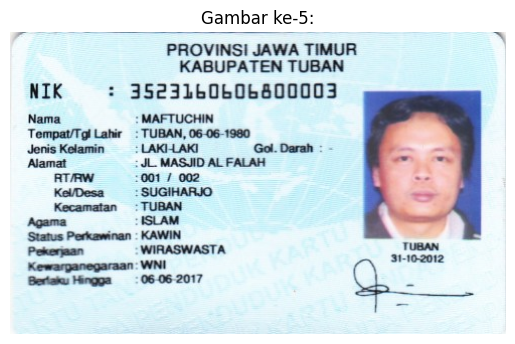

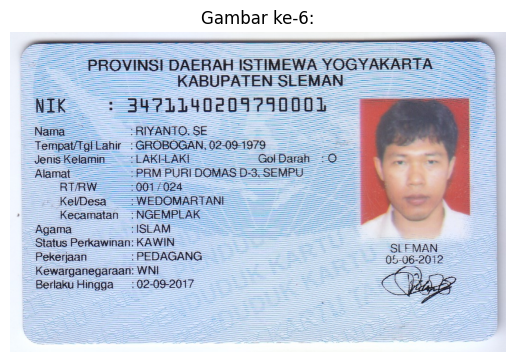

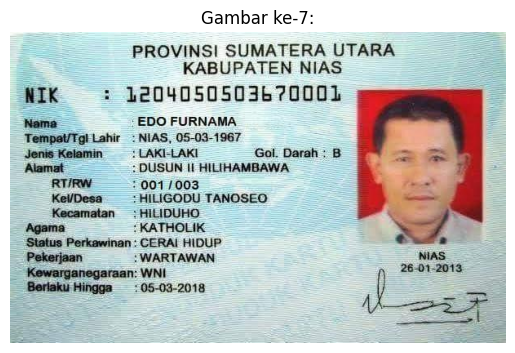

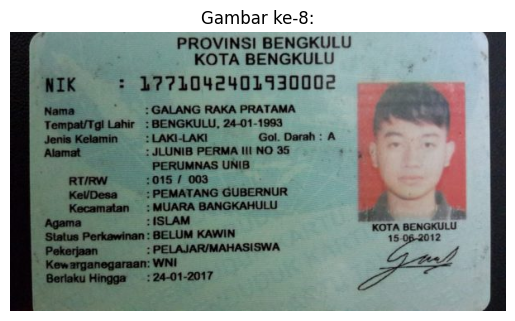

In [68]:
# Direktori data
direct_data = '/content/drive/MyDrive/KTP_More'

# Mengambil daftar file dalam direktori
files = os.listdir(direct_data)

# Menyaring hanya file dengan ekstensi gambar tertentu (contoh: jpg, png)
image_files = [f for f in files if f.lower().endswith(('.jpg', '.png', '.jpeg', '.gif'))]

# Loop melalui semua gambar dalam direktori
for i, img_file in enumerate(image_files, start=1):
    img_path = os.path.join(direct_data, img_file)
    img = cv2.imread(img_path)

    # Tampilkan gambar
    plt.figure()
    plt.axis('off')
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f'Gambar ke-{i}:')
    plt.show()

## Global Treshold

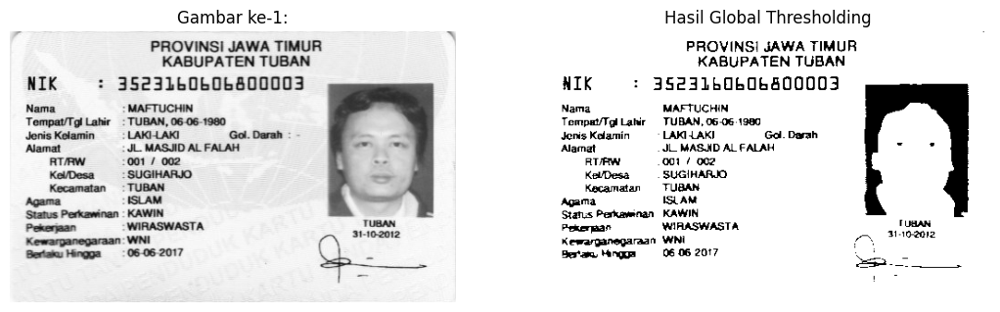

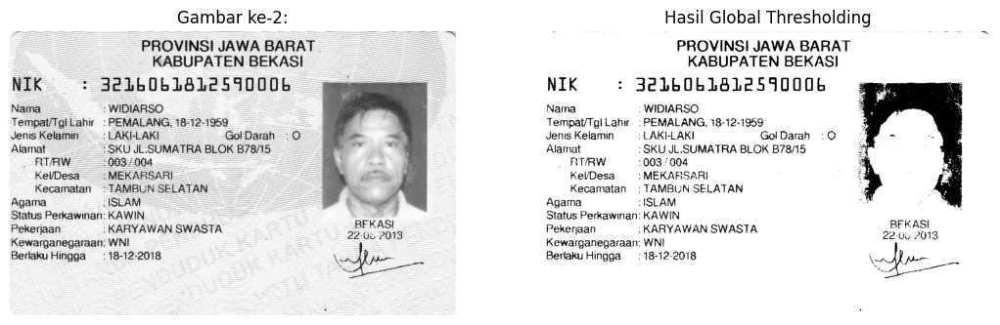

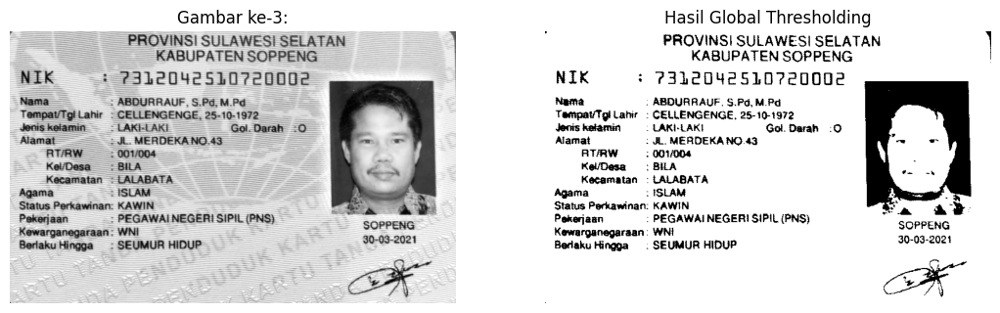

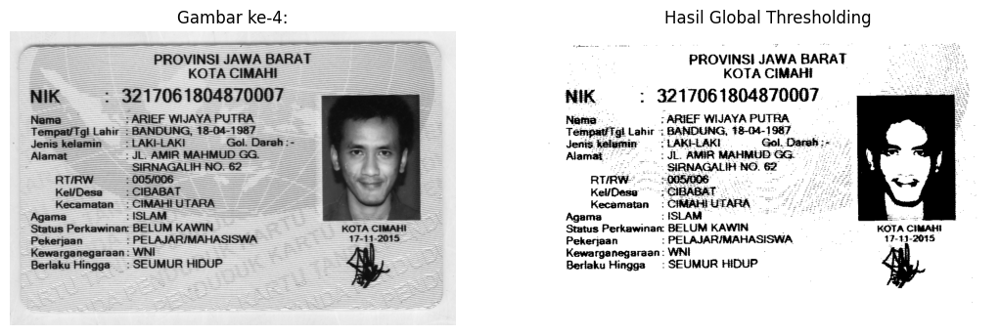

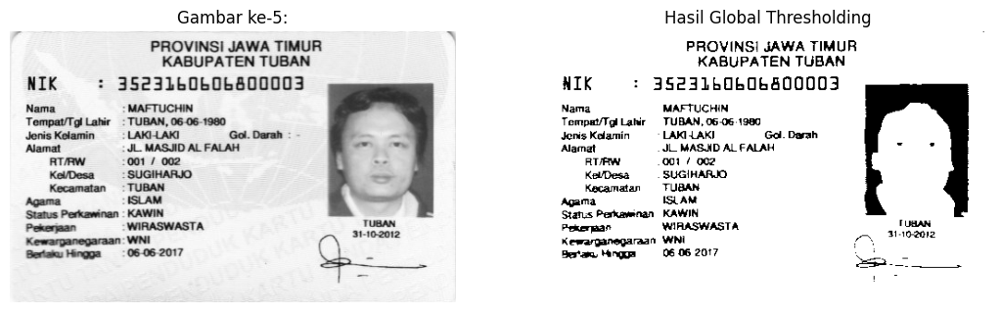

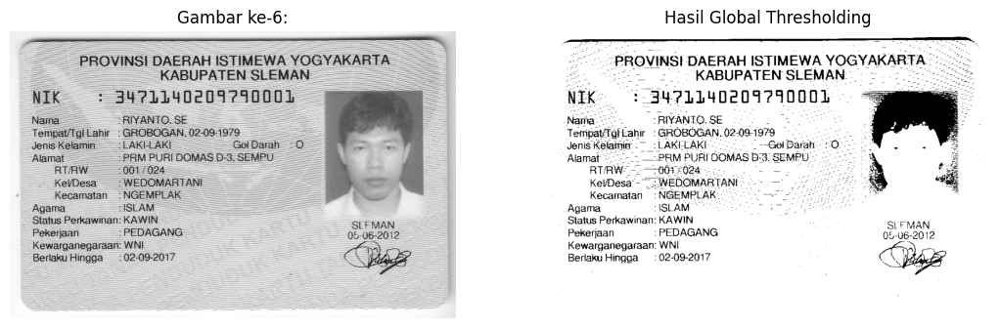

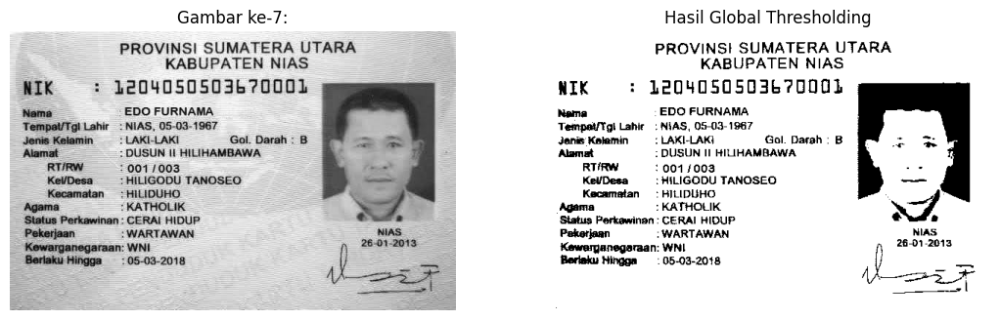

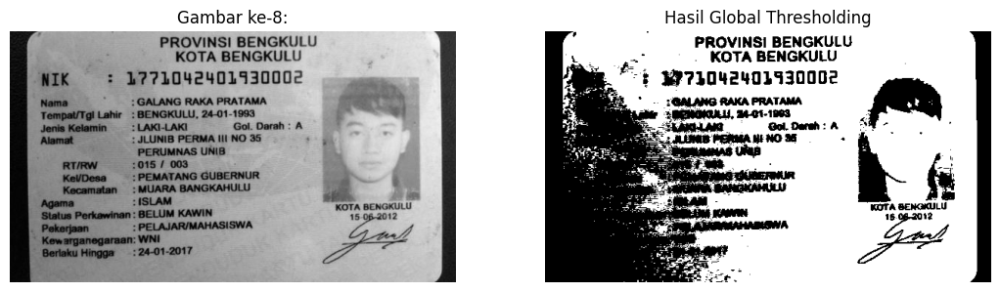

In [72]:
# Direktori tempat gambar-gambar berada
direct_data = '/content/drive/MyDrive/KTP_More'

# Menggunakan os.listdir untuk mengambil daftar file dalam direktori
files = os.listdir(direct_data)

# Menyaring hanya file dengan ekstensi gambar tertentu (contoh: jpg, png)
image_files = [f for f in files if f.lower().endswith(('.jpg', '.png', '.jpeg', '.gif'))]

# Loop melalui semua gambar dalam direktori
for i, img_file in enumerate(image_files, start=1):
    img_path = os.path.join(direct_data, img_file)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    # Terapkan thresholding global
    # Nilai tresh = 120
    ret, thresh = cv2.threshold(img, 120, 255, cv2.THRESH_BINARY)

    # Tampilkan gambar asli, citra hasil thresholding, dan judulnya
    plt.figure(figsize=(20, 4))

    plt.subplot(131)
    plt.axis('off')
    plt.imshow(img, cmap='gray')
    plt.title(f'Gambar ke-{i}:')

    plt.subplot(132)
    plt.axis('off')
    plt.imshow(thresh, cmap='gray')
    plt.title(f'Hasil Global Thresholding')

    plt.show()


##Otsu Treshold

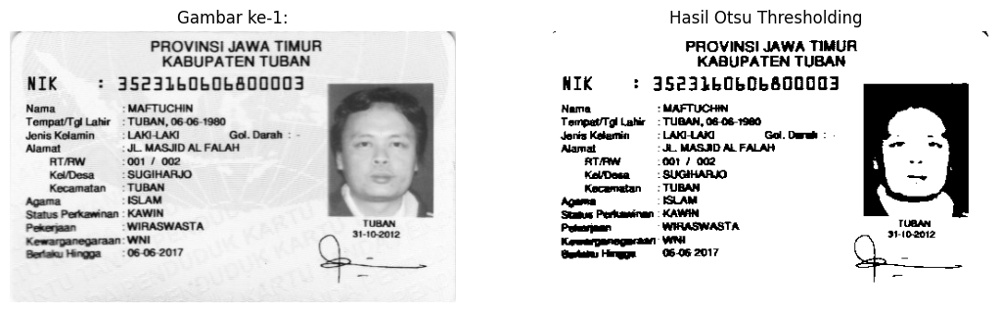

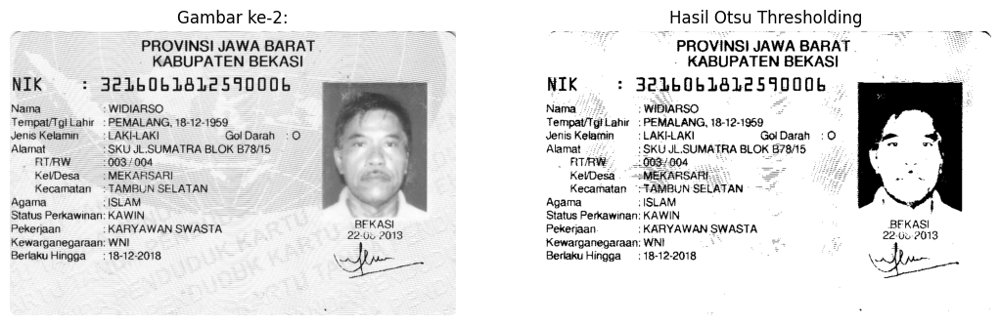

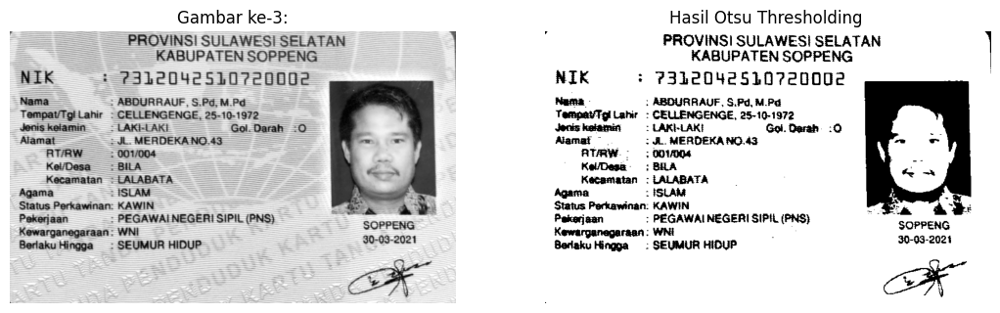

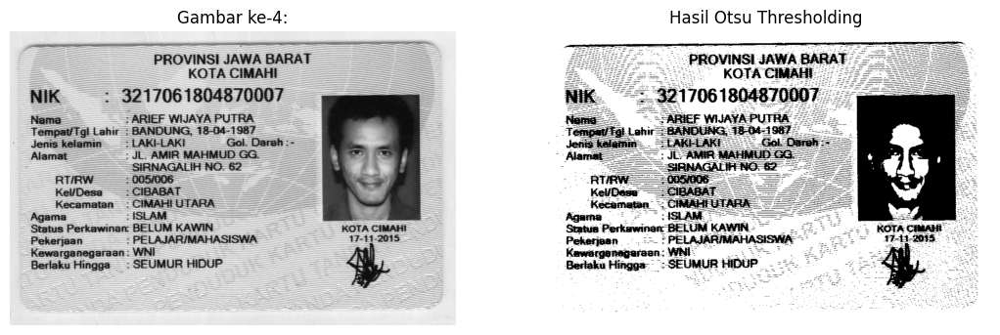

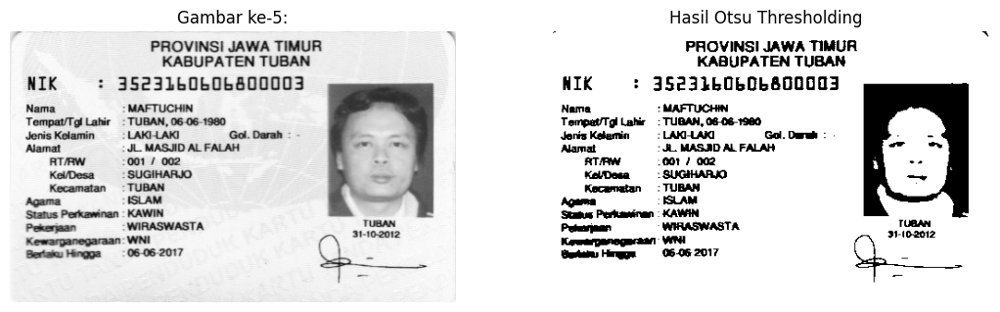

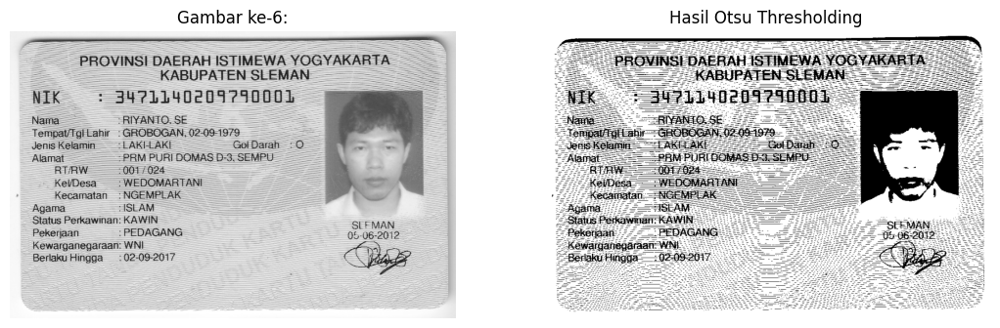

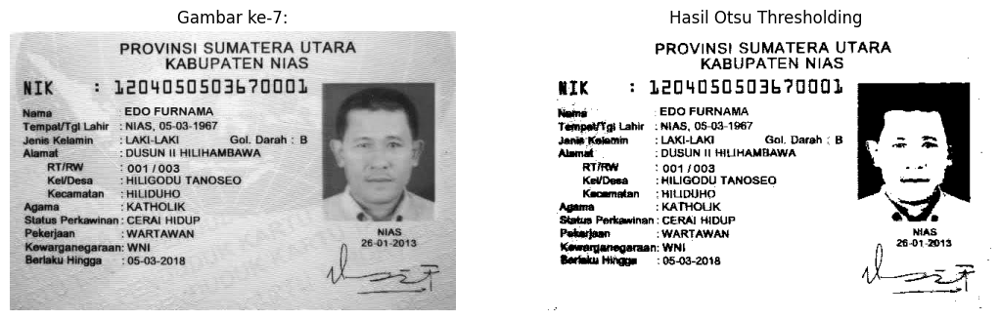

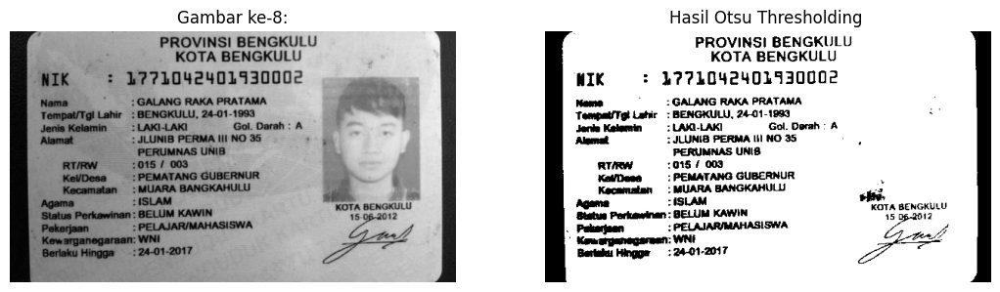

In [77]:
# Direktori data
direct_data = '/content/drive/MyDrive/KTP_More'

# Mengambil daftar file
files = os.listdir(direct_data)

# Menyaring hanya file dengan ekstensi gambar tertentu
image_files = [f for f in files if f.lower().endswith(('.jpg', '.png', '.jpeg', '.gif'))]

# Loop melalui semua gambar dalam direktori
for i, img_file in enumerate(image_files, start=1):
    img_path = os.path.join(direct_data, img_file)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    # Terapkan thresholding Otsu dengan library
    ret, thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Tampilkan gambar asli, citra hasil thresholding, dan judulnya
    plt.figure(figsize=(20, 4))

    plt.subplot(131)
    plt.axis('off')
    plt.imshow(img, cmap='gray')
    plt.title(f'Gambar ke-{i}:')

    plt.subplot(132)
    plt.axis('off')
    plt.imshow(thresh, cmap='gray')
    plt.title(f'Hasil Otsu Thresholding ')

    plt.show()

## Adaptive Treshold

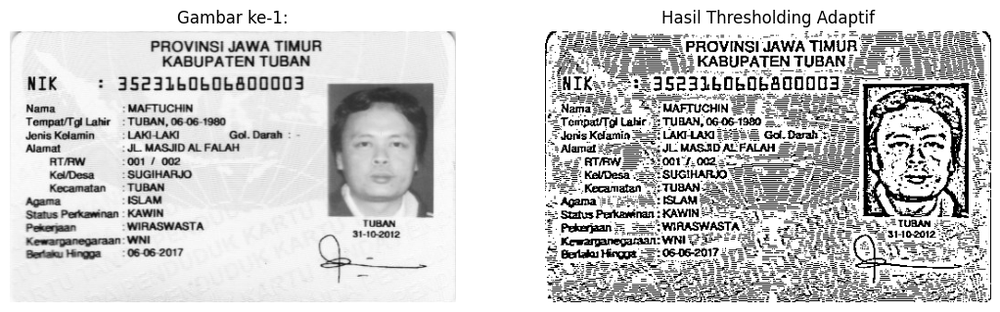

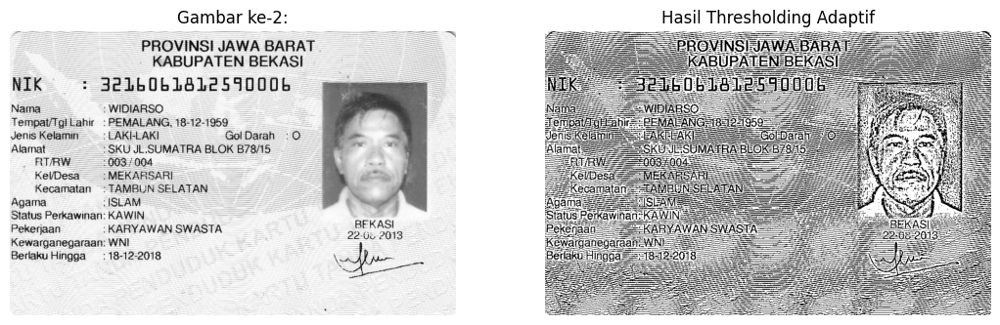

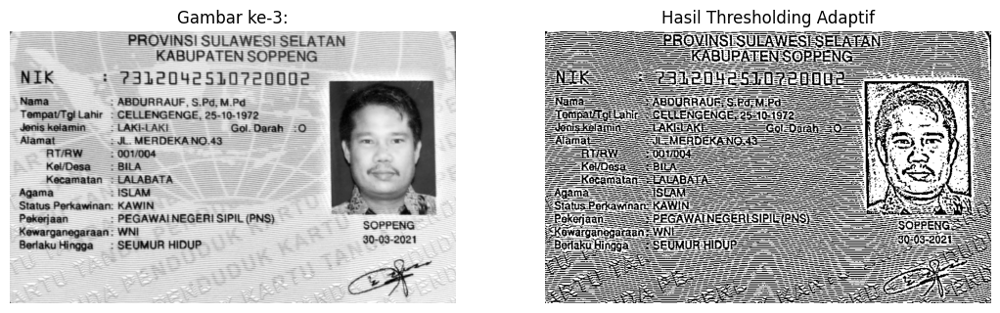

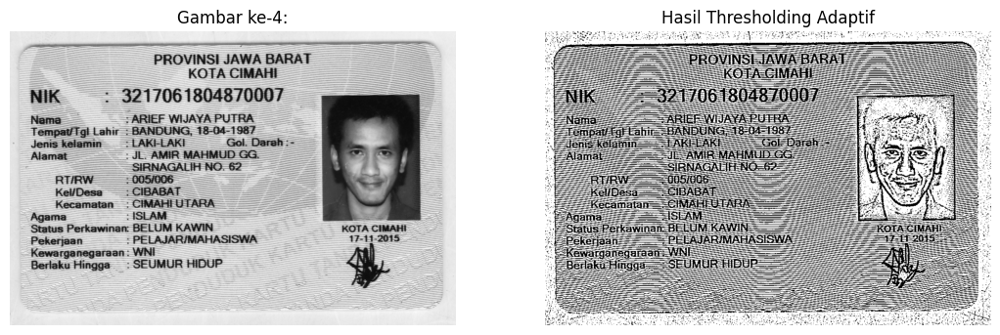

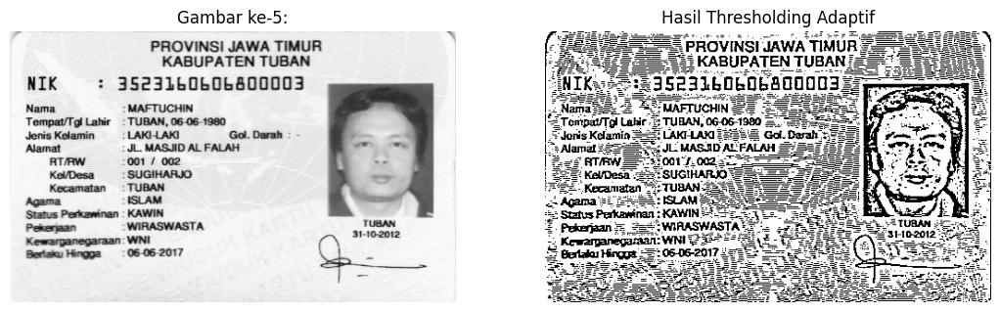

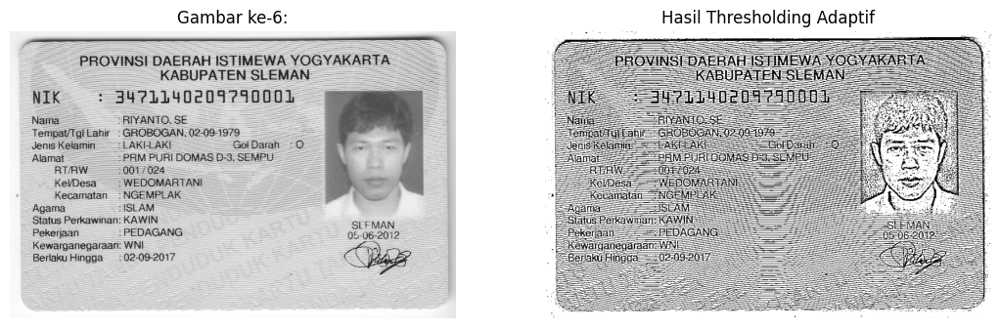

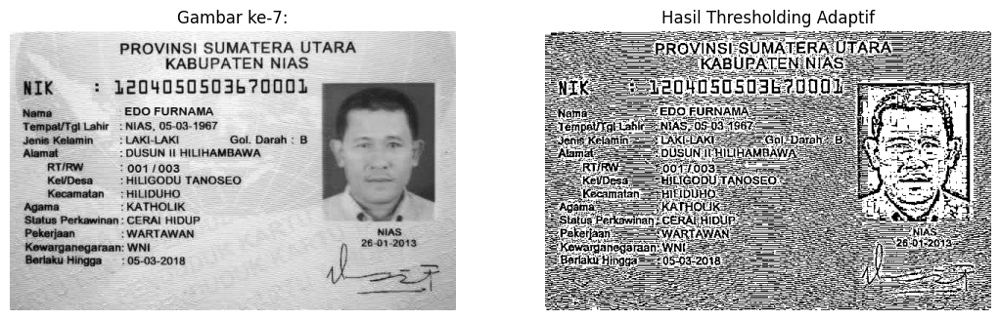

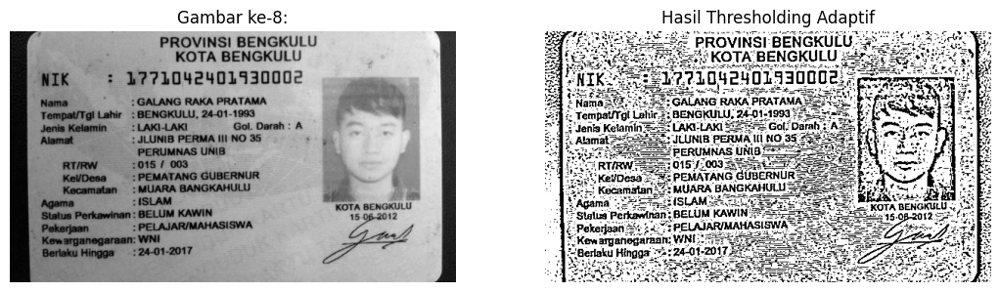

In [76]:
# Direktori data
direct_data = '/content/drive/MyDrive/KTP_More'

# Mengambil daftar file
files = os.listdir(direct_data)

# Menyaring hanya file dengan ekstensi gambar tertentu
image_files = [f for f in files if f.lower().endswith(('.jpg', '.png', '.jpeg', '.gif'))]

# Loop melalui semua gambar dalam direktori
for i, img_file in enumerate(image_files, start=1):
    img_path = os.path.join(direct_data, img_file)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    # Terapkan thresholding adaptif
    thresh = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

    # Tampilkan gambar asli, citra hasil thresholding adaptif, dan judulnya
    plt.figure(figsize=(20, 4))

    plt.subplot(131)
    plt.axis('off')
    plt.imshow(img, cmap='gray')
    plt.title(f'Gambar ke-{i}:')

    plt.subplot(132)
    plt.axis('off')
    plt.imshow(thresh, cmap='gray')
    plt.title(f'Hasil Thresholding Adaptif')

    plt.show()


##K-Means

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


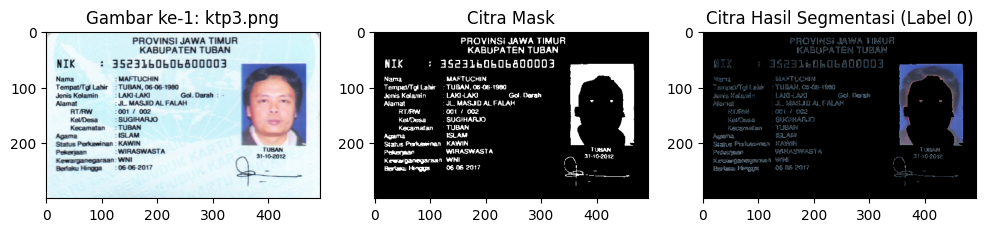

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


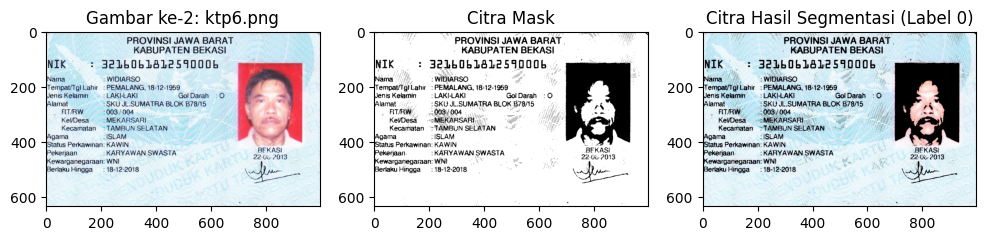

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


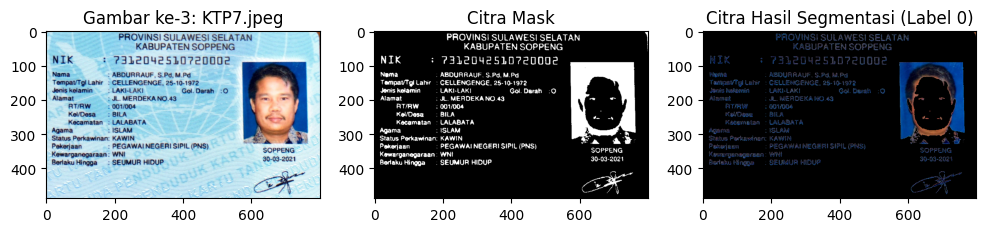

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


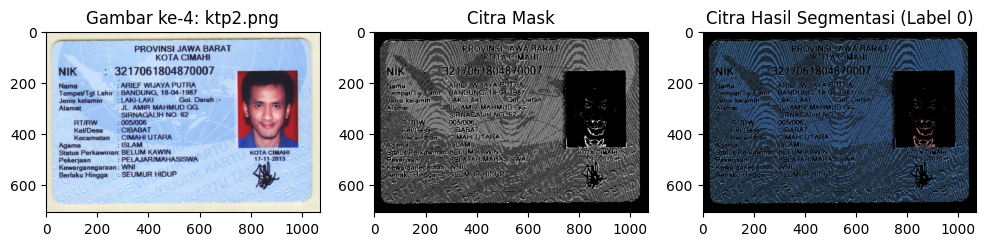

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


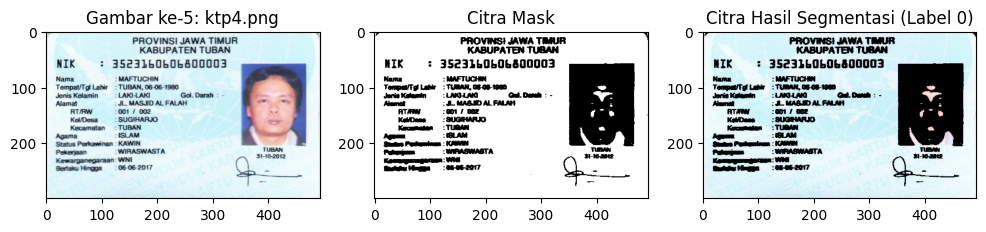

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


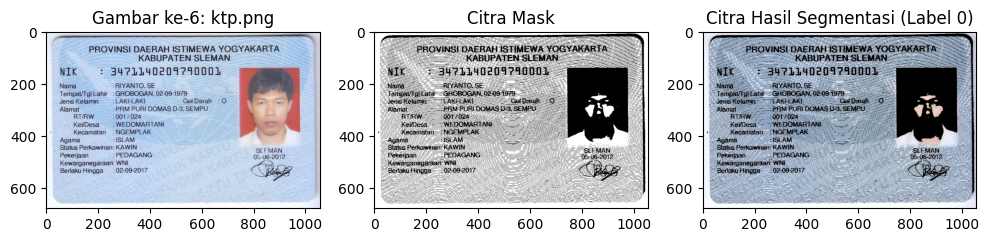

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


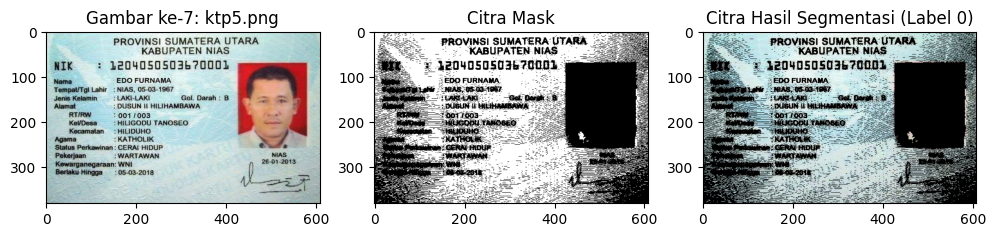

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


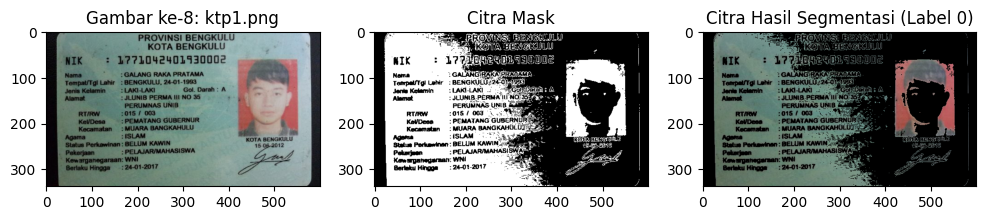

In [79]:
# Direktori
direct_data = '/content/drive/MyDrive/KTP_More'

# Mengambil daftar file
files = os.listdir(direct_data)

# Menyaring hanya file dengan ekstensi gambar tertentu
image_files = [f for f in files if f.lower().endswith(('.jpg', '.png', '.jpeg', '.gif'))]

# Jumlah cluster (warna) yang ingin diidentifikasi
n_clusters = 3

# Loop melalui semua gambar dalam direktori
for i, img_file in enumerate(image_files, start=1):
    img_path = os.path.join(direct_data, img_file)
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    pixel_values = img_rgb.reshape((-1, 3))

    # Inisialisasi model K-Means
    kmeans = KMeans(n_clusters=n_clusters)

    # Latih model K-Means pada vektor piksel
    kmeans.fit(pixel_values)

    # Dapatkan label cluster untuk setiap piksel
    labels = kmeans.labels_

    # Dapatkan pusat cluster (centroid)
    centers = kmeans.cluster_centers_

    # Ambil satu label cluster yang sesuai dengan warna tertentu
    label_to_extract = 0

    # Buat mask hanya untuk warna yang sesuai dengan label cluster tertentu
    mask = (labels == label_to_extract).reshape(img_rgb.shape[:2])

    # Buat citra hanya dengan warna yang sesuai dengan label cluster tertentu
    segmented_image = np.zeros_like(img_rgb)
    segmented_image[mask] = img_rgb[mask]

    # Tampilkan gambar asli, citra mask, dan hasil segmentasi
    plt.figure(figsize=(12, 6))

    plt.subplot(131)
    plt.imshow(img_rgb)
    plt.title(f'Gambar ke-{i}: {img_file}')

    plt.subplot(132)
    plt.imshow(mask, cmap='gray')
    plt.title('Citra Mask')

    plt.subplot(133)
    plt.imshow(segmented_image)
    plt.title(f'Citra Hasil Segmentasi (Label {label_to_extract})')

    plt.show()
